In [1]:
import os
import numpy as np
from tqdm import tqdm
import cv2 as cv
from PIL import Image
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split

from keras import Model
from keras.callbacks import Callback
from keras.optimizers import Adam
from keras.utils import plot_model
from keras.layers import Input, Conv2D, Conv2DTranspose, MaxPooling2D, concatenate, Dropout

2025-01-27 15:26:33.215575: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2025-01-27 15:26:33.490777: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1738020393.617955   42913 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1738020393.654584   42913 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2025-01-27 15:26:33.913986: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instr

In [2]:
image_path = '../test/training/Images/'
mask_path = '../test/training/Masks/'
SIZE = 128

In [3]:
# lists of images and masks names
image_names = sorted(next(os.walk(image_path))[-1])
mask_names = sorted(next(os.walk(mask_path))[-1])

images = np.zeros(shape=(len(image_names),SIZE, SIZE, 3))
masks = np.zeros(shape=(len(image_names),SIZE, SIZE, 1))

for id in tqdm(range(len(image_names)), desc="Images"):
  path = image_path + image_names[id]
  img = np.asarray(Image.open(path)).astype('float')/255.
  img = cv.resize(img, (SIZE,SIZE), cv.INTER_AREA)
  images[id] = img

for id in tqdm(range(len(mask_names)), desc="Mask"):
  path = mask_path + mask_names[id]
  mask = np.asarray(Image.open(path)).astype('float')/255.
  mask = cv.resize(mask, (SIZE,SIZE), cv.INTER_AREA)
  masks[id] = mask[:,:,:1]

Mask: 100%|██████████| 3078/3078 [00:13<00:00, 225.61it/s]


In [14]:
# Train test split
# images_train, images_test, mask_train, mask_test = train_test_split(images, masks, test_size=0.01)

# Train test split with no images left for testing
images_train = images
images_test = []
mask_train = masks
mask_test = []

In [16]:
print(f'Train images: {len(images_train)}')
print(f'Test images: {len(images_test)}')

Train images: 3078
Test images: 0


In [17]:
# Define U-net architecture
def unet_model(input_layer, start_neurons):
    # Contraction path
    conv1 = Conv2D(start_neurons, kernel_size=(3, 3), activation="relu", padding="same")(input_layer)
    conv1 = Conv2D(start_neurons, kernel_size=(3, 3), activation="relu", padding="same")(conv1)
    pool1 = MaxPooling2D((2, 2))(conv1)
    pool1 = Dropout(0.25)(pool1)

    conv2 = Conv2D(start_neurons*2, kernel_size=(3, 3), activation="relu", padding="same")(pool1)
    conv2 = Conv2D(start_neurons*2, kernel_size=(3, 3), activation="relu", padding="same")(conv2)
    pool2 = MaxPooling2D((2, 2))(conv2)
    pool2 = Dropout(0.5)(pool2)

    conv3 = Conv2D(start_neurons*4, kernel_size=(3, 3), activation="relu", padding="same")(pool2)
    conv3 = Conv2D(start_neurons*4, kernel_size=(3, 3), activation="relu", padding="same")(conv3)
    pool3 = MaxPooling2D((2, 2))(conv3)
    pool3 = Dropout(0.5)(pool3)

    conv4 = Conv2D(start_neurons*8, kernel_size=(3, 3), activation="relu", padding="same")(pool3)
    conv4 = Conv2D(start_neurons*8, kernel_size=(3, 3), activation="relu", padding="same")(conv4)
    pool4 = MaxPooling2D((2, 2))(conv4)
    pool4 = Dropout(0.5)(pool4)

    # Middle
    convm = Conv2D(start_neurons*16, kernel_size=(3, 3), activation="relu", padding="same")(pool4)
    convm = Conv2D(start_neurons*16, kernel_size=(3, 3), activation="relu", padding="same")(convm)
    
    # Expansive path
    deconv4 = Conv2DTranspose(start_neurons*8, kernel_size=(3, 3), strides=(2, 2), padding="same")(convm)
    uconv4 = concatenate([deconv4, conv4])
    uconv4 = Dropout(0.5)(uconv4)
    uconv4 = Conv2D(start_neurons*8, kernel_size=(3, 3), activation="relu", padding="same")(uconv4)
    uconv4 = Conv2D(start_neurons*8, kernel_size=(3, 3), activation="relu", padding="same")(uconv4)

    deconv3 = Conv2DTranspose(start_neurons*4, kernel_size=(3, 3), strides=(2, 2), padding="same")(uconv4)
    uconv3 = concatenate([deconv3, conv3])
    uconv3 = Dropout(0.5)(uconv3)
    uconv3 = Conv2D(start_neurons*4, kernel_size=(3, 3), activation="relu", padding="same")(uconv3)
    uconv3 = Conv2D(start_neurons*4, kernel_size=(3, 3), activation="relu", padding="same")(uconv3)

    deconv2 = Conv2DTranspose(start_neurons*2, kernel_size=(3, 3), strides=(2, 2), padding="same")(uconv3)
    uconv2 = concatenate([deconv2, conv2])
    uconv2 = Dropout(0.5)(uconv2)
    uconv2 = Conv2D(start_neurons*2, kernel_size=(3, 3), activation="relu", padding="same")(uconv2)
    uconv2 = Conv2D(start_neurons*2, kernel_size=(3, 3), activation="relu", padding="same")(uconv2)

    deconv1 = Conv2DTranspose(start_neurons*1, kernel_size=(3, 3), strides=(2, 2), padding="same")(uconv2)
    uconv1 = concatenate([deconv1, conv1])
    uconv1 = Dropout(0.5)(uconv1)
    uconv1 = Conv2D(start_neurons, kernel_size=(3, 3), activation="relu", padding="same")(uconv1)
    uconv1 = Conv2D(start_neurons, kernel_size=(3, 3), activation="relu", padding="same")(uconv1)
    
    # Last conv and output
    output_layer = Conv2D(1, (1,1), padding="same", activation="sigmoid")(uconv1)
    
    return output_layer

In [18]:
# Compile unet model
input_layer = Input((SIZE, SIZE, 3))
output_layer = unet_model(input_layer = input_layer, start_neurons = 16)

model = Model(input_layer, output_layer)
model.compile(loss="binary_crossentropy", optimizer="adam", metrics=["accuracy"])
model.summary()

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_1       │ (None, 128, 128,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_19 (Conv2D)  │ (None, 128, 128,  │        448 │ input_layer_1[0]… │
│                     │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_20 (Conv2D)  │ (None, 128, 128,  │      2,320 │ conv2d_19[0][0]   │
│                     │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_4     │ (None, 64, 64,    │          0 │ conv2d_20[0][0]   │
│ (MaxPooling2D)      │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_8 (Dropout) │ (None, 64, 64,    │          0 │ max_pooling2d_4[… │
│                     │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_21 (Conv2D)  │ (None, 64, 64,    │      4,640 │ dropout_8[0][0]   │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_22 (Conv2D)  │ (None, 64, 64,    │      9,248 │ conv2d_21[0][0]   │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_5     │ (None, 32, 32,    │          0 │ conv2d_22[0][0]   │
│ (MaxPooling2D)      │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_9 (Dropout) │ (None, 32, 32,    │          0 │ max_pooling2d_5[… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_23 (Conv2D)  │ (None, 32, 32,    │     18,496 │ dropout_9[0][0]   │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_24 (Conv2D)  │ (None, 32, 32,    │     36,928 │ conv2d_23[0][0]   │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_6     │ (None, 16, 16,    │          0 │ conv2d_24[0][0]   │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_10          │ (None, 16, 16,    │          0 │ max_pooling2d_6[… │
│ (Dropout)           │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_25 (Conv2D)  │ (None, 16, 16,    │     73,856 │ dropout_10[0][0]  │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_26 (Conv2D)  │ (None, 16, 16,    │    147,584 │ conv2d_25[0][0]   │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_7     │ (None, 8, 8, 128) │          0 │ conv2d_26[0][0]   │
│ (MaxPooling2D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_11          │ (None, 8, 8, 128) │          0 │ max_pooling2d_7[

 Total params: 2,158,705 (8.23 MB)

 Trainable params: 2,158,705 (8.23 MB)

 Non-trainable params: 0 (0.00 B)

In [19]:
# Post Process
def mask_threshold(image, threshold=0.25):
  return image>threshold

# Callback to show progress of learning on the images after each epoch
class ShowProgress(Callback):
  def __init__(self, save=False):
    self.save = save
  def on_epoch_end(self, epoch, logs=None):
    k = np.random.randint(len(images_train))
    original_image = images_train[k][np.newaxis,...]
    predicted_mask = self.model.predict(original_image).reshape(128,128)
    proc_mask02 = mask_threshold(predicted_mask, threshold=0.2)
    proc_mask03 = mask_threshold(predicted_mask, threshold=0.3)
    proc_mask04 = mask_threshold(predicted_mask, threshold=0.4)
    proc_mask05 = mask_threshold(predicted_mask, threshold=0.5)
    mask = mask_train[k].reshape(128,128)

    plt.figure(figsize=(15,10))

    plt.subplot(1,7,1)
    plt.imshow(original_image[0]);plt.title('Orginal Image')

    plt.subplot(1,7,2)
    plt.imshow(predicted_mask, cmap='gray');plt.title('Predicted Mask')
    
    plt.subplot(1,7,3)
    plt.imshow(mask, cmap='gray');plt.title('Orginal Mask')

    plt.subplot(1,7,4)
    plt.imshow(proc_mask02, cmap='gray');plt.title('Processed: 0.2')

    plt.subplot(1,7,5)
    plt.imshow(proc_mask03, cmap='gray');plt.title('Processed: 0.3')

    plt.subplot(1,7,6)
    plt.imshow(proc_mask04, cmap='gray');plt.title('Processed: 0.4')

    plt.subplot(1,7,6)
    plt.imshow(proc_mask05, cmap='gray');plt.title('Processed: 0.5')

    plt.tight_layout()
    plt.show()

Epoch 1/100
 3/97 ━━━━━━━━━━━━━━━━━━━━ 4s 43ms/step - accuracy: 0.4522 - loss: 0.6880

2025-01-27 15:36:40.092689: I external/local_xla/xla/stream_executor/cuda/cuda_asm_compiler.cc:397] ptxas warning : Registers are spilled to local memory in function 'input_transpose_fusion_4', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'input_transpose_fusion', 8 bytes spill stores, 8 bytes spill loads



97/97 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step - accuracy: 0.5682 - loss: 0.5965

2025-01-27 15:36:47.632132: I external/local_xla/xla/service/gpu/autotuning/conv_algorithm_picker.cc:557] Omitted potentially buggy algorithm eng14{} for conv (f32[1,16,128,128]{3,2,1,0}, u8[0]{0}) custom-call(f32[1,3,128,128]{3,2,1,0}, f32[16,3,3,3]{3,2,1,0}, f32[16]{0}), window={size=3x3 pad=1_1x1_1}, dim_labels=bf01_oi01->bf01, custom_call_target="__cudnn$convBiasActivationForward", backend_config={"cudnn_conv_backend_config":{"activation_mode":"kRelu","conv_result_scale":1,"leakyrelu_alpha":0,"side_input_scale":0},"force_earliest_schedule":false,"operation_queue_id":"0","wait_on_operation_queues":[]}
2025-01-27 15:36:47.652472: I external/local_xla/xla/service/gpu/autotuning/conv_algorithm_picker.cc:557] Omitted potentially buggy algorithm eng14{} for conv (f32[1,16,128,128]{3,2,1,0}, u8[0]{0}) custom-call(f32[1,16,128,128]{3,2,1,0}, f32[16,16,3,3]{3,2,1,0}, f32[16]{0}), window={size=3x3 pad=1_1x1_1}, dim_labels=bf01_oi01->bf01, custom_call_target="__cudnn$convBiasActivationForward

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 698ms/step


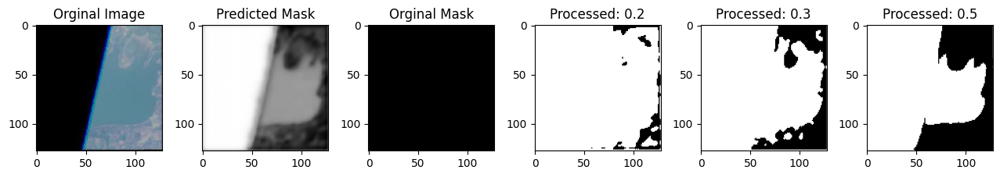

97/97 ━━━━━━━━━━━━━━━━━━━━ 14s 87ms/step - accuracy: 0.5686 - loss: 0.5960
Epoch 2/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepep - accuracy: 0.6766 - loss: 0.44


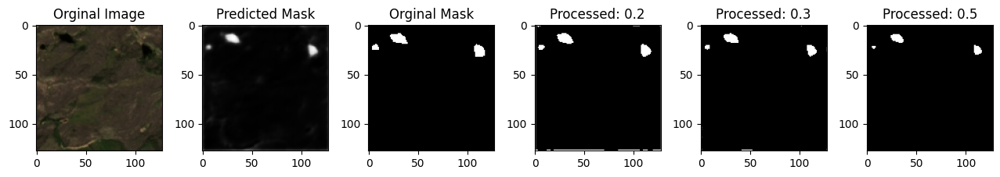

97/97 ━━━━━━━━━━━━━━━━━━━━ 4s 42ms/step - accuracy: 0.6766 - loss: 0.4477
Epoch 3/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepep - accuracy: 0.6638 - loss: 0.43


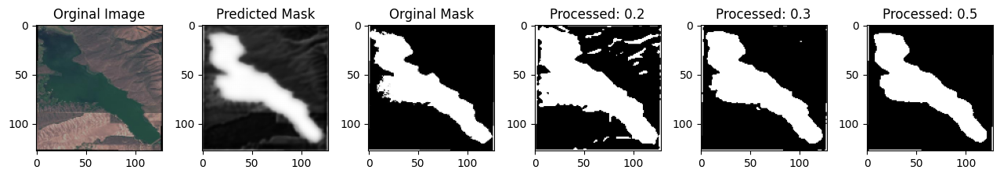

97/97 ━━━━━━━━━━━━━━━━━━━━ 4s 39ms/step - accuracy: 0.6641 - loss: 0.4390
Epoch 4/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/steptep - accuracy: 0.6929 - loss: 0.39


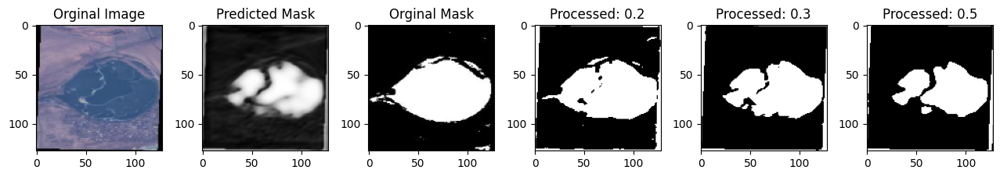

97/97 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - accuracy: 0.6930 - loss: 0.3928
Epoch 5/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepep - accuracy: 0.7017 - loss: 0.37


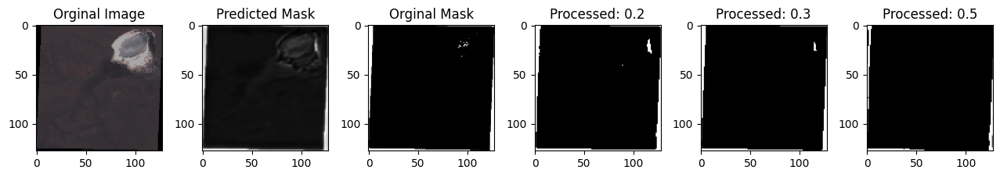

97/97 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - accuracy: 0.7017 - loss: 0.3734
Epoch 6/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepep - accuracy: 0.7062 - loss: 0.368


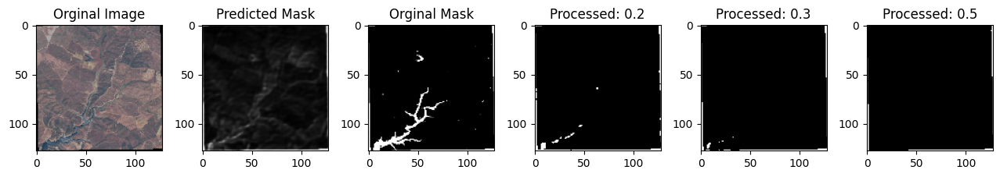

97/97 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - accuracy: 0.7063 - loss: 0.3681
Epoch 7/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/steptep - accuracy: 0.7143 - loss: 0.34


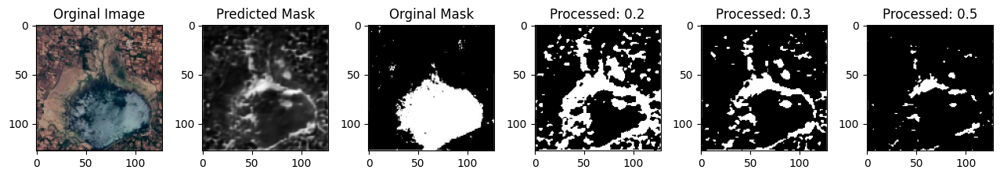

97/97 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - accuracy: 0.7143 - loss: 0.3450
Epoch 8/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepep - accuracy: 0.7198 - loss: 0.34


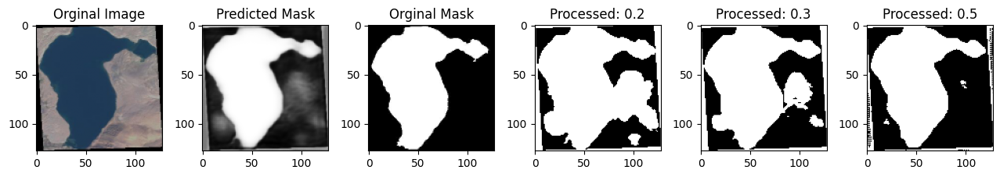

97/97 ━━━━━━━━━━━━━━━━━━━━ 4s 41ms/step - accuracy: 0.7197 - loss: 0.3487
Epoch 9/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepep - accuracy: 0.7245 - loss: 0.32


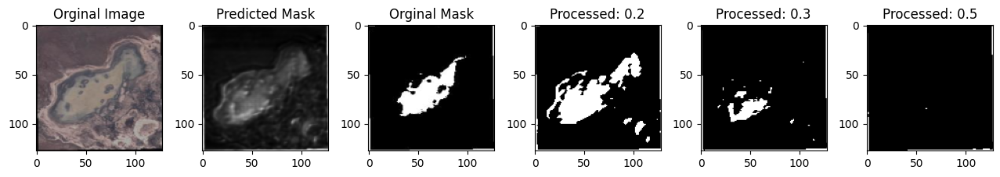

97/97 ━━━━━━━━━━━━━━━━━━━━ 4s 44ms/step - accuracy: 0.7244 - loss: 0.3252
Epoch 10/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepep - accuracy: 0.7211 - loss: 0.327


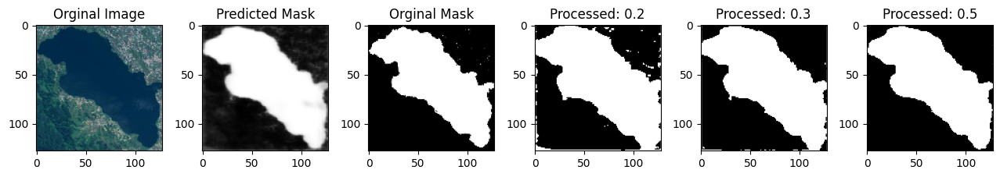

97/97 ━━━━━━━━━━━━━━━━━━━━ 4s 46ms/step - accuracy: 0.7211 - loss: 0.3270
Epoch 11/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepep - accuracy: 0.7197 - loss: 0.33


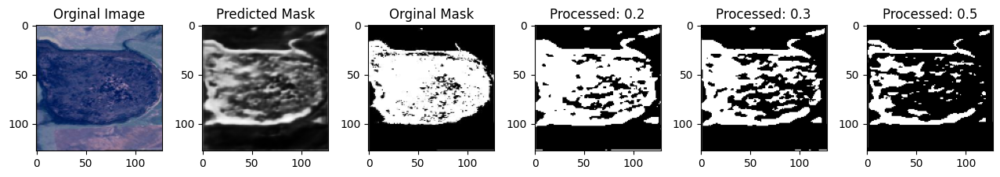

97/97 ━━━━━━━━━━━━━━━━━━━━ 4s 44ms/step - accuracy: 0.7197 - loss: 0.3306
Epoch 12/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepep - accuracy: 0.7241 - loss: 0.32


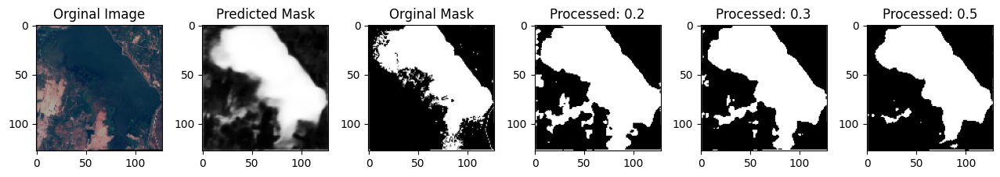

97/97 ━━━━━━━━━━━━━━━━━━━━ 5s 46ms/step - accuracy: 0.7241 - loss: 0.3209
Epoch 13/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/stepep - accuracy: 0.7246 - loss: 0.318


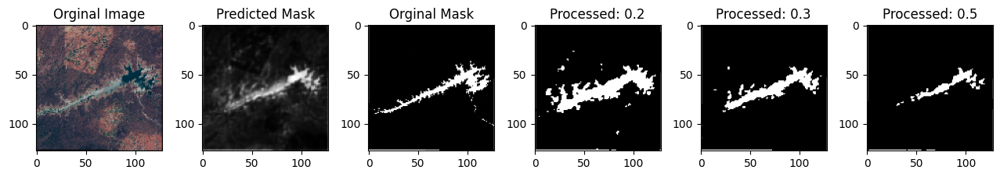

97/97 ━━━━━━━━━━━━━━━━━━━━ 5s 49ms/step - accuracy: 0.7246 - loss: 0.3182
Epoch 14/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepep - accuracy: 0.7310 - loss: 0.303


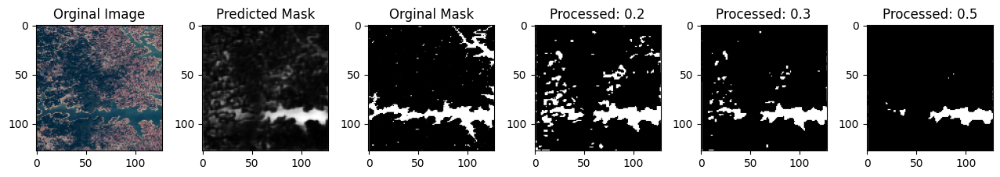

97/97 ━━━━━━━━━━━━━━━━━━━━ 5s 49ms/step - accuracy: 0.7310 - loss: 0.3037
Epoch 15/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepep - accuracy: 0.7300 - loss: 0.308


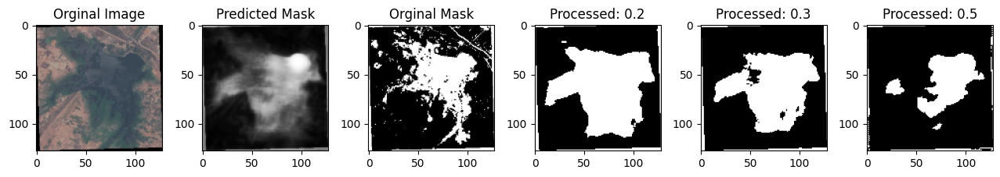

97/97 ━━━━━━━━━━━━━━━━━━━━ 5s 49ms/step - accuracy: 0.7300 - loss: 0.3087
Epoch 16/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepep - accuracy: 0.7155 - loss: 0.36


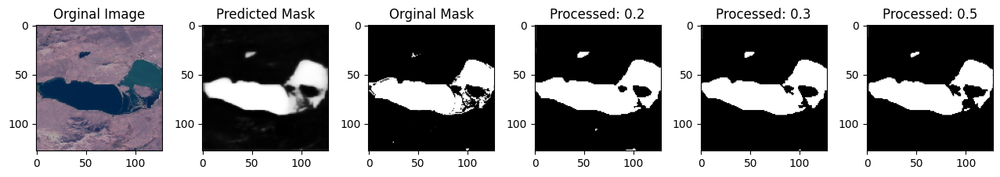

97/97 ━━━━━━━━━━━━━━━━━━━━ 5s 47ms/step - accuracy: 0.7156 - loss: 0.3631
Epoch 17/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepep - accuracy: 0.7357 - loss: 0.298


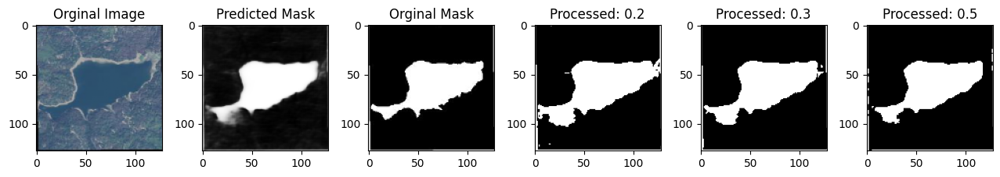

97/97 ━━━━━━━━━━━━━━━━━━━━ 5s 47ms/step - accuracy: 0.7356 - loss: 0.2985
Epoch 18/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepep - accuracy: 0.7290 - loss: 0.30


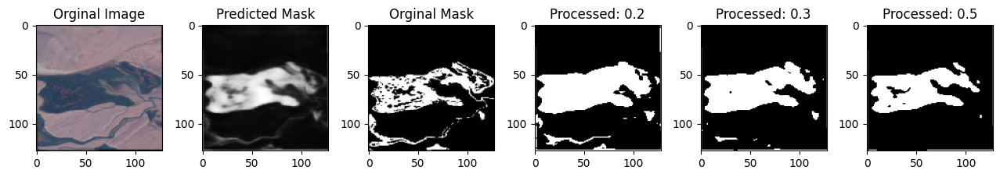

97/97 ━━━━━━━━━━━━━━━━━━━━ 5s 47ms/step - accuracy: 0.7290 - loss: 0.3039
Epoch 19/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepep - accuracy: 0.7356 - loss: 0.290


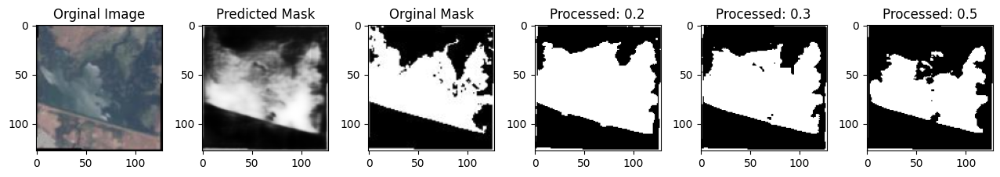

97/97 ━━━━━━━━━━━━━━━━━━━━ 5s 47ms/step - accuracy: 0.7356 - loss: 0.2907
Epoch 20/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepep - accuracy: 0.7421 - loss: 0.28


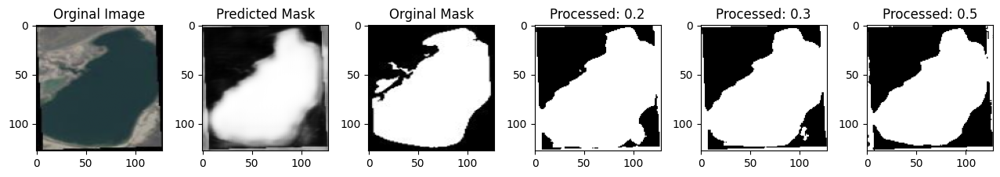

97/97 ━━━━━━━━━━━━━━━━━━━━ 5s 49ms/step - accuracy: 0.7420 - loss: 0.2857
Epoch 21/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepep - accuracy: 0.7449 - loss: 0.269


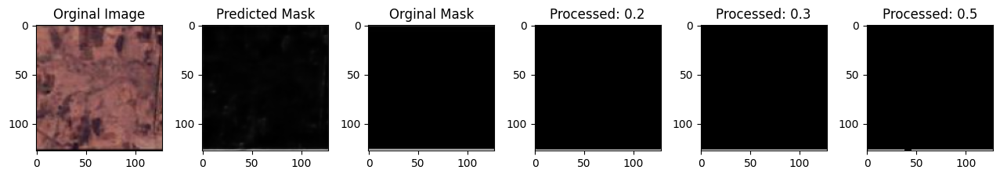

97/97 ━━━━━━━━━━━━━━━━━━━━ 5s 47ms/step - accuracy: 0.7448 - loss: 0.2700
Epoch 22/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/stepep - accuracy: 0.7448 - loss: 0.280


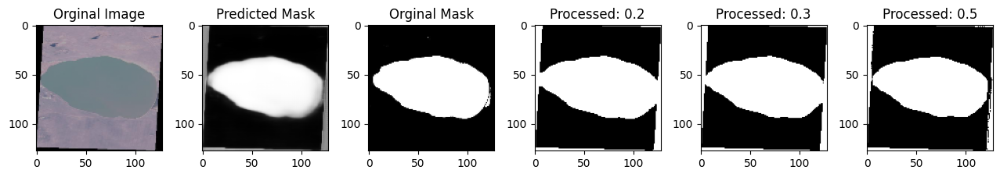

97/97 ━━━━━━━━━━━━━━━━━━━━ 5s 47ms/step - accuracy: 0.7448 - loss: 0.2801
Epoch 23/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/stepep - accuracy: 0.7415 - loss: 0.276


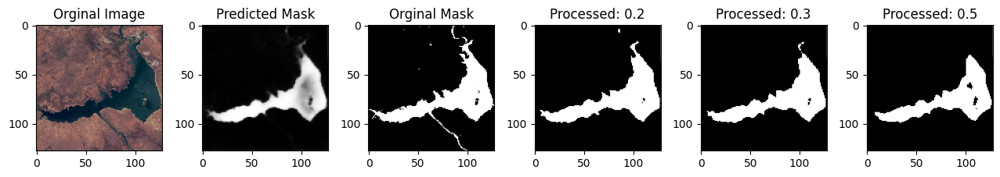

97/97 ━━━━━━━━━━━━━━━━━━━━ 5s 47ms/step - accuracy: 0.7415 - loss: 0.2761
Epoch 24/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/stepep - accuracy: 0.7508 - loss: 0.258


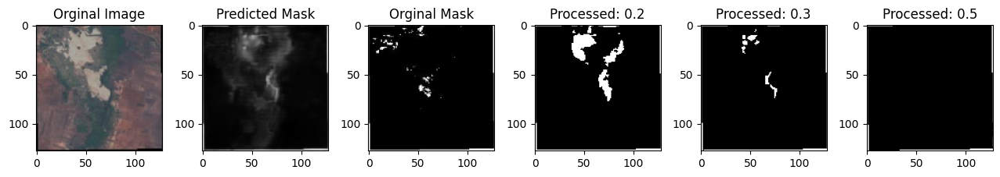

97/97 ━━━━━━━━━━━━━━━━━━━━ 5s 47ms/step - accuracy: 0.7508 - loss: 0.2587
Epoch 25/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepep - accuracy: 0.7425 - loss: 0.258


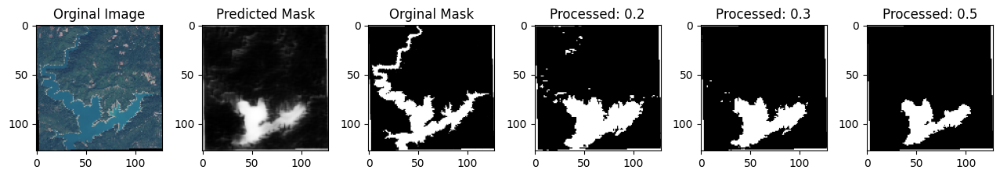

97/97 ━━━━━━━━━━━━━━━━━━━━ 5s 49ms/step - accuracy: 0.7427 - loss: 0.2585
Epoch 26/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepep - accuracy: 0.7338 - loss: 0.27


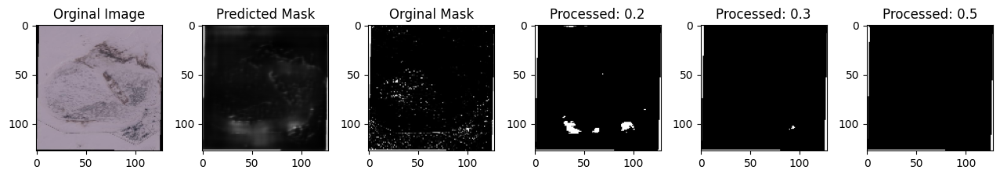

97/97 ━━━━━━━━━━━━━━━━━━━━ 5s 46ms/step - accuracy: 0.7339 - loss: 0.2793
Epoch 27/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepep - accuracy: 0.7447 - loss: 0.25


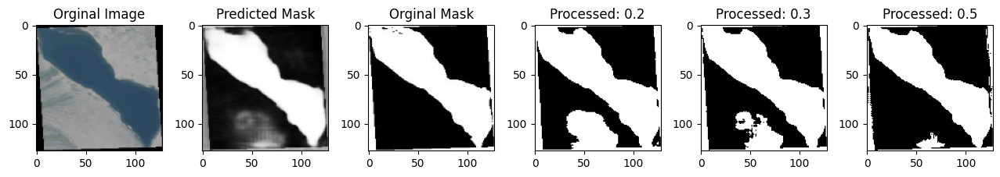

97/97 ━━━━━━━━━━━━━━━━━━━━ 4s 46ms/step - accuracy: 0.7448 - loss: 0.2546
Epoch 28/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepep - accuracy: 0.7561 - loss: 0.240


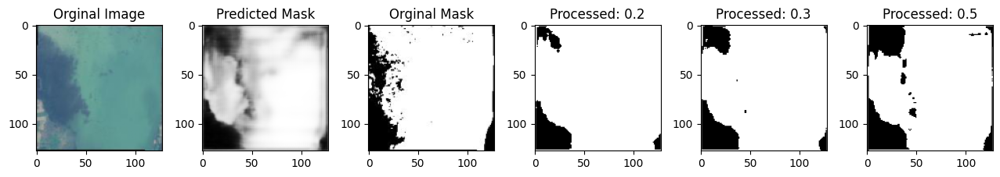

97/97 ━━━━━━━━━━━━━━━━━━━━ 4s 45ms/step - accuracy: 0.7561 - loss: 0.2407
Epoch 29/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/steptep - accuracy: 0.7500 - loss: 0.25


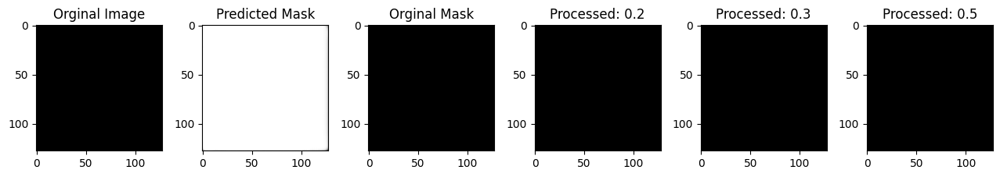

97/97 ━━━━━━━━━━━━━━━━━━━━ 4s 46ms/step - accuracy: 0.7500 - loss: 0.2515
Epoch 30/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepep - accuracy: 0.7557 - loss: 0.24


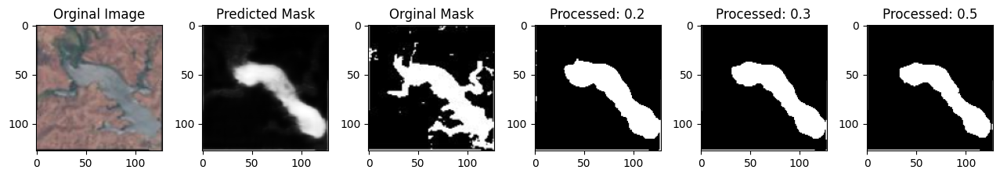

97/97 ━━━━━━━━━━━━━━━━━━━━ 4s 44ms/step - accuracy: 0.7556 - loss: 0.2448
Epoch 31/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepep - accuracy: 0.7501 - loss: 0.245


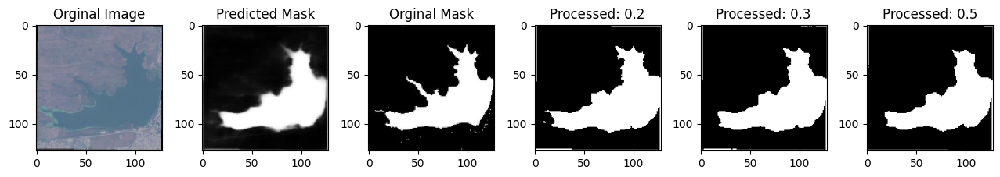

97/97 ━━━━━━━━━━━━━━━━━━━━ 5s 46ms/step - accuracy: 0.7501 - loss: 0.2454
Epoch 32/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/stepep - accuracy: 0.7572 - loss: 0.235


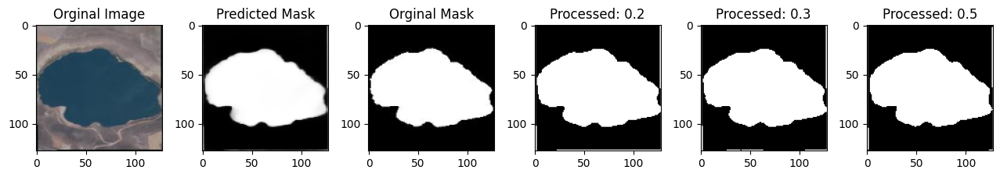

97/97 ━━━━━━━━━━━━━━━━━━━━ 4s 44ms/step - accuracy: 0.7572 - loss: 0.2359
Epoch 33/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepep - accuracy: 0.7483 - loss: 0.24


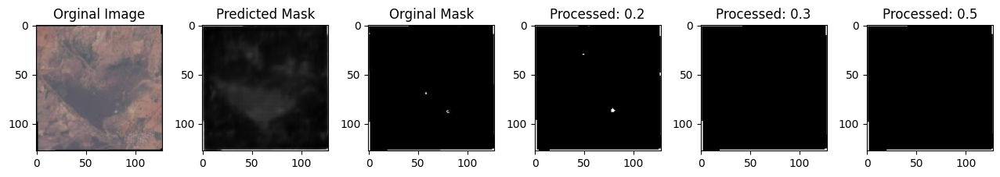

97/97 ━━━━━━━━━━━━━━━━━━━━ 4s 45ms/step - accuracy: 0.7484 - loss: 0.2424
Epoch 34/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepep - accuracy: 0.7555 - loss: 0.23


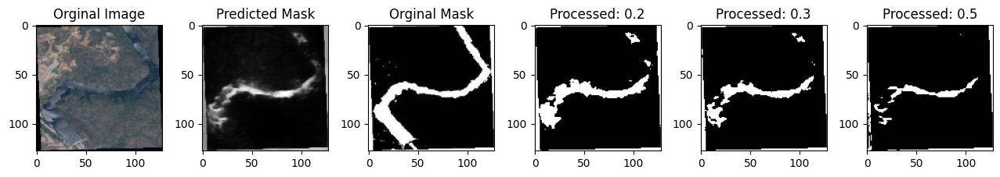

97/97 ━━━━━━━━━━━━━━━━━━━━ 4s 44ms/step - accuracy: 0.7555 - loss: 0.2347
Epoch 35/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepep - accuracy: 0.7562 - loss: 0.22


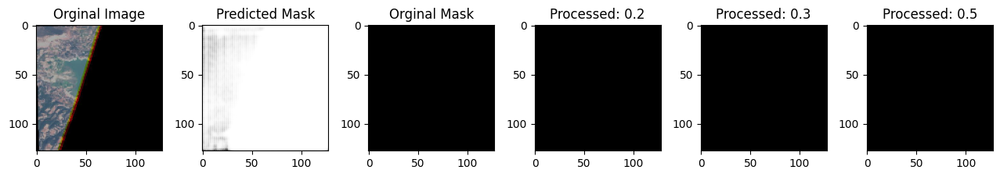

97/97 ━━━━━━━━━━━━━━━━━━━━ 4s 44ms/step - accuracy: 0.7562 - loss: 0.2297
Epoch 36/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepep - accuracy: 0.7600 - loss: 0.22


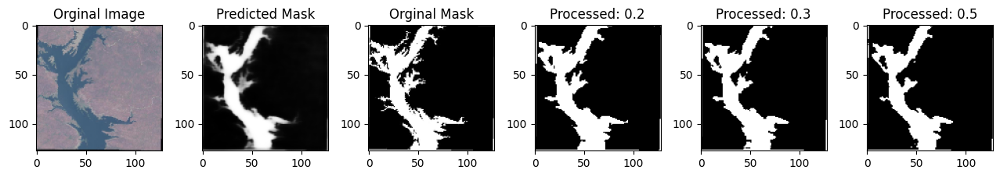

97/97 ━━━━━━━━━━━━━━━━━━━━ 4s 44ms/step - accuracy: 0.7600 - loss: 0.2229
Epoch 37/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/steptep - accuracy: 0.7561 - loss: 0.22


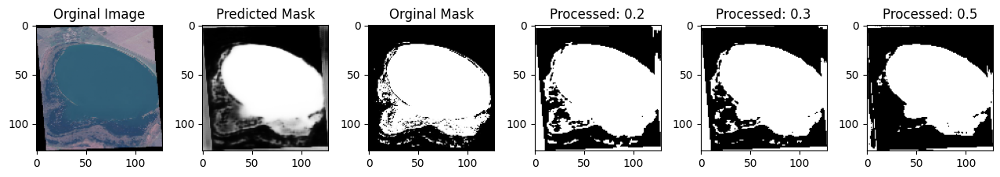

97/97 ━━━━━━━━━━━━━━━━━━━━ 4s 44ms/step - accuracy: 0.7561 - loss: 0.2282
Epoch 38/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/steptep - accuracy: 0.7612 - loss: 0.22


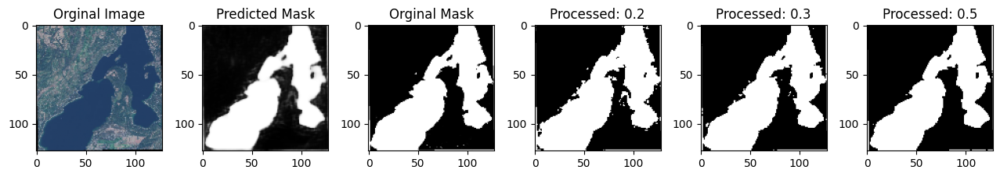

97/97 ━━━━━━━━━━━━━━━━━━━━ 4s 46ms/step - accuracy: 0.7612 - loss: 0.2248
Epoch 39/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepep - accuracy: 0.7611 - loss: 0.22


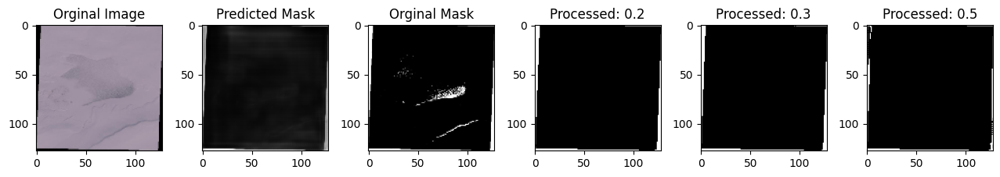

97/97 ━━━━━━━━━━━━━━━━━━━━ 4s 44ms/step - accuracy: 0.7610 - loss: 0.2201
Epoch 40/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepep - accuracy: 0.7579 - loss: 0.23


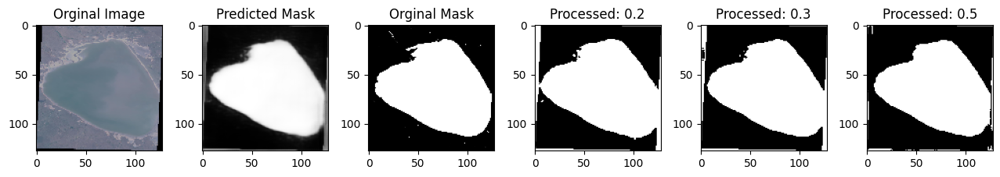

97/97 ━━━━━━━━━━━━━━━━━━━━ 4s 44ms/step - accuracy: 0.7579 - loss: 0.2320
Epoch 41/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepep - accuracy: 0.7569 - loss: 0.230


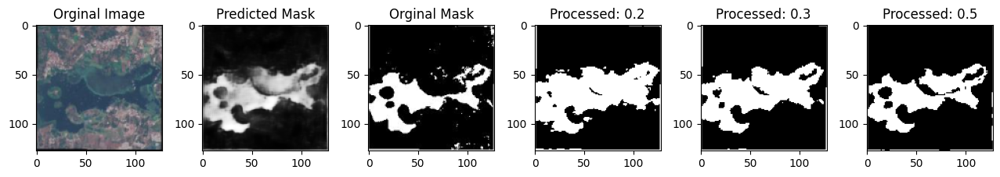

97/97 ━━━━━━━━━━━━━━━━━━━━ 4s 44ms/step - accuracy: 0.7569 - loss: 0.2305
Epoch 42/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepep - accuracy: 0.7517 - loss: 0.23


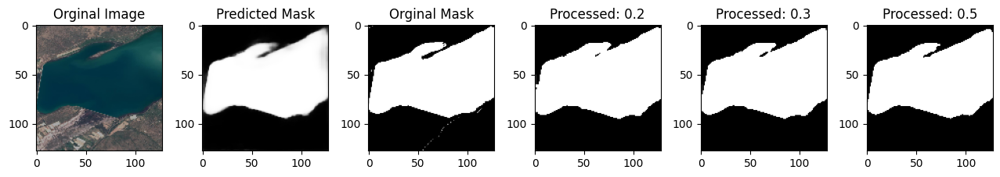

97/97 ━━━━━━━━━━━━━━━━━━━━ 4s 44ms/step - accuracy: 0.7518 - loss: 0.2304
Epoch 43/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/stepep - accuracy: 0.7479 - loss: 0.243


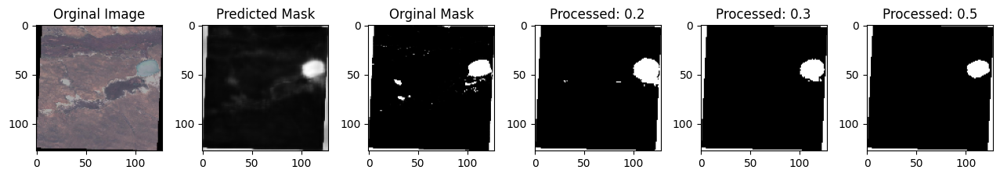

97/97 ━━━━━━━━━━━━━━━━━━━━ 4s 44ms/step - accuracy: 0.7480 - loss: 0.2429
Epoch 44/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepep - accuracy: 0.7587 - loss: 0.21


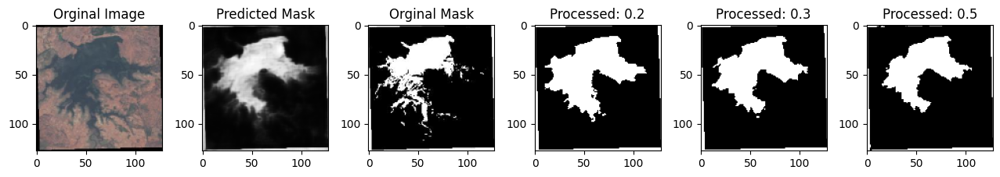

97/97 ━━━━━━━━━━━━━━━━━━━━ 4s 44ms/step - accuracy: 0.7587 - loss: 0.2188
Epoch 45/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepep - accuracy: 0.7665 - loss: 0.21


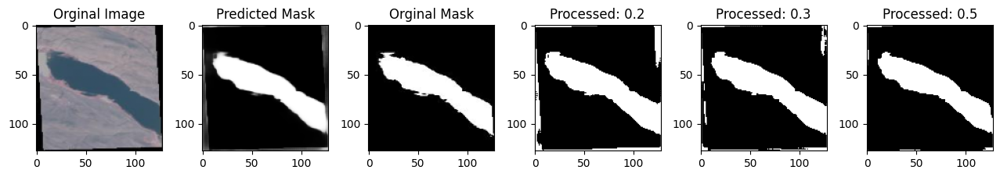

97/97 ━━━━━━━━━━━━━━━━━━━━ 4s 44ms/step - accuracy: 0.7665 - loss: 0.2135
Epoch 46/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepep - accuracy: 0.7614 - loss: 0.21


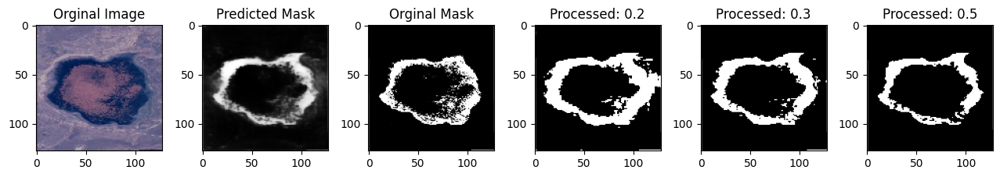

97/97 ━━━━━━━━━━━━━━━━━━━━ 4s 44ms/step - accuracy: 0.7614 - loss: 0.2126
Epoch 47/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/steptep - accuracy: 0.7647 - loss: 0.21


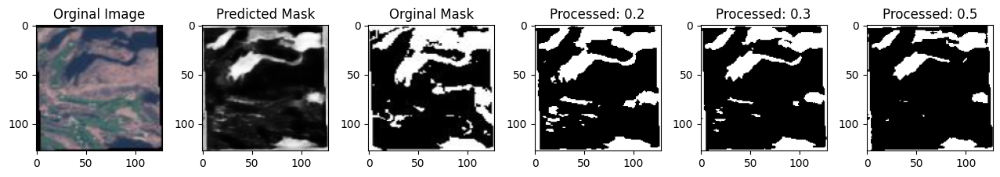

97/97 ━━━━━━━━━━━━━━━━━━━━ 4s 45ms/step - accuracy: 0.7647 - loss: 0.2168
Epoch 48/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepep - accuracy: 0.7643 - loss: 0.22


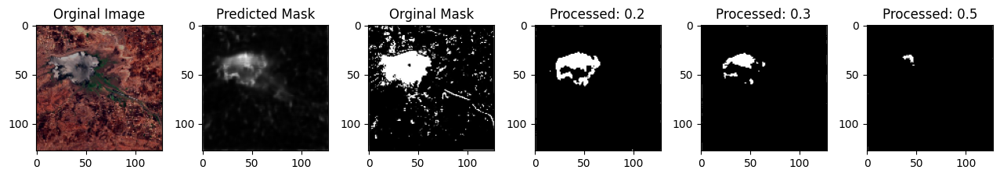

97/97 ━━━━━━━━━━━━━━━━━━━━ 4s 43ms/step - accuracy: 0.7642 - loss: 0.2213
Epoch 49/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepep - accuracy: 0.7617 - loss: 0.208


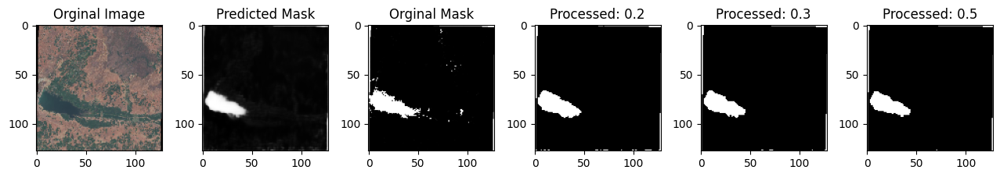

97/97 ━━━━━━━━━━━━━━━━━━━━ 4s 43ms/step - accuracy: 0.7618 - loss: 0.2089
Epoch 50/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepep - accuracy: 0.7634 - loss: 0.21


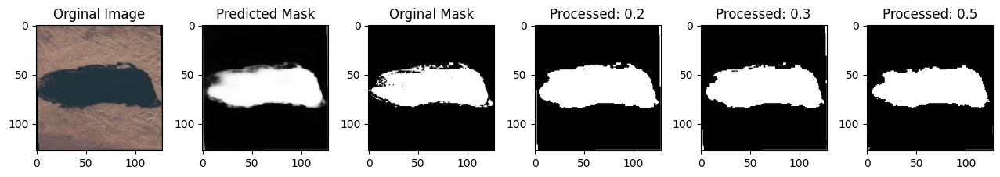

97/97 ━━━━━━━━━━━━━━━━━━━━ 4s 43ms/step - accuracy: 0.7634 - loss: 0.2153
Epoch 51/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepep - accuracy: 0.7693 - loss: 0.20


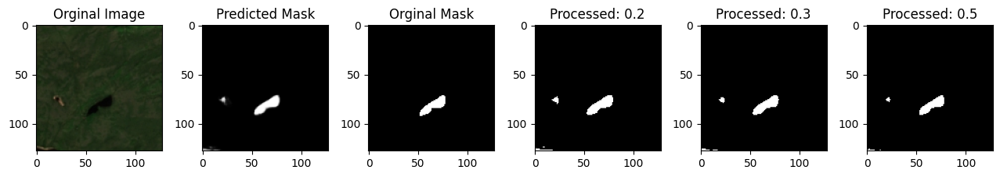

97/97 ━━━━━━━━━━━━━━━━━━━━ 4s 43ms/step - accuracy: 0.7693 - loss: 0.2091
Epoch 52/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepep - accuracy: 0.7578 - loss: 0.22


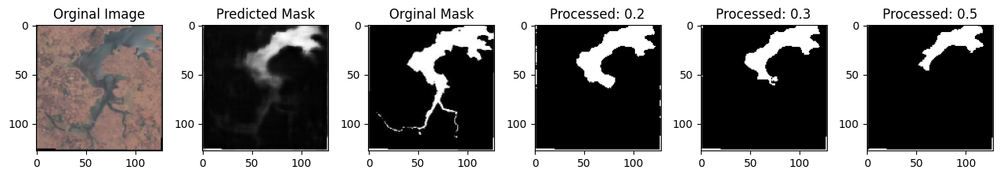

97/97 ━━━━━━━━━━━━━━━━━━━━ 4s 43ms/step - accuracy: 0.7579 - loss: 0.2238
Epoch 53/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepep - accuracy: 0.7599 - loss: 0.22


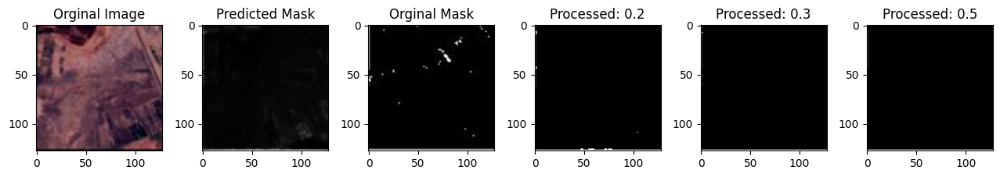

97/97 ━━━━━━━━━━━━━━━━━━━━ 4s 43ms/step - accuracy: 0.7599 - loss: 0.2297
Epoch 54/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepep - accuracy: 0.7640 - loss: 0.219


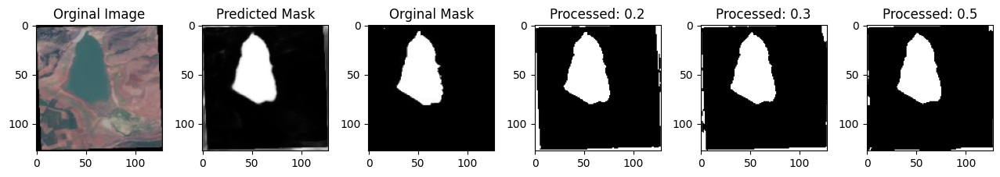

97/97 ━━━━━━━━━━━━━━━━━━━━ 4s 43ms/step - accuracy: 0.7640 - loss: 0.2198
Epoch 55/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepep - accuracy: 0.7655 - loss: 0.20


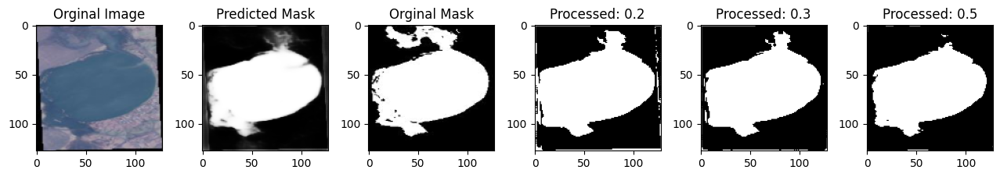

97/97 ━━━━━━━━━━━━━━━━━━━━ 4s 44ms/step - accuracy: 0.7655 - loss: 0.2069
Epoch 56/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepep - accuracy: 0.7694 - loss: 0.20


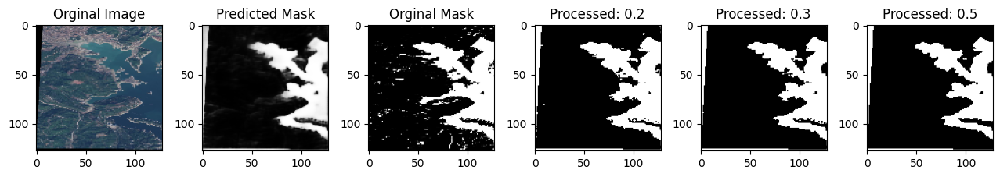

97/97 ━━━━━━━━━━━━━━━━━━━━ 4s 44ms/step - accuracy: 0.7693 - loss: 0.2043
Epoch 57/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepep - accuracy: 0.7686 - loss: 0.20


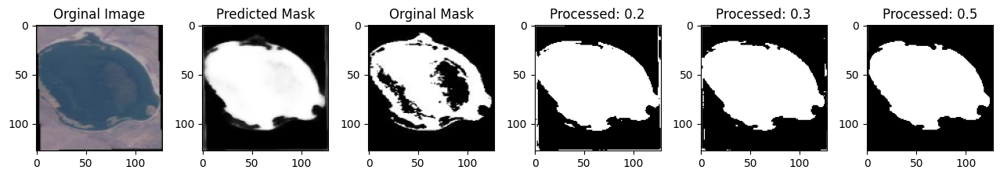

97/97 ━━━━━━━━━━━━━━━━━━━━ 4s 46ms/step - accuracy: 0.7685 - loss: 0.2013
Epoch 58/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/stepep - accuracy: 0.7694 - loss: 0.201


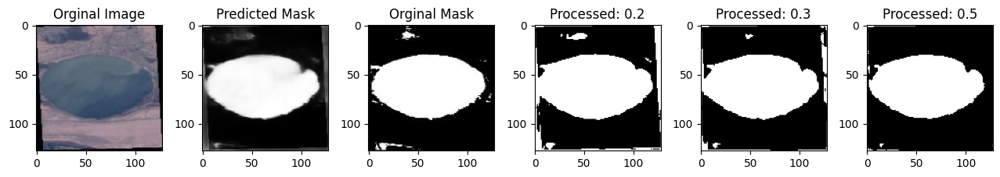

97/97 ━━━━━━━━━━━━━━━━━━━━ 4s 44ms/step - accuracy: 0.7694 - loss: 0.2012
Epoch 59/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepep - accuracy: 0.7637 - loss: 0.20


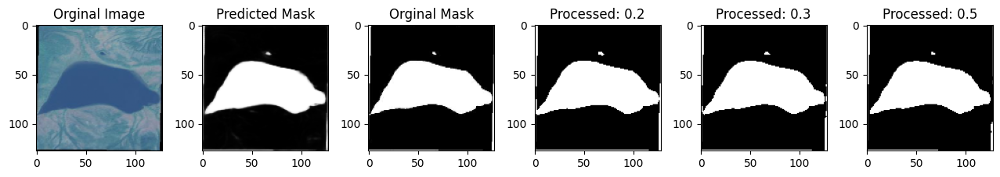

97/97 ━━━━━━━━━━━━━━━━━━━━ 4s 44ms/step - accuracy: 0.7638 - loss: 0.2093
Epoch 60/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepep - accuracy: 0.7658 - loss: 0.200


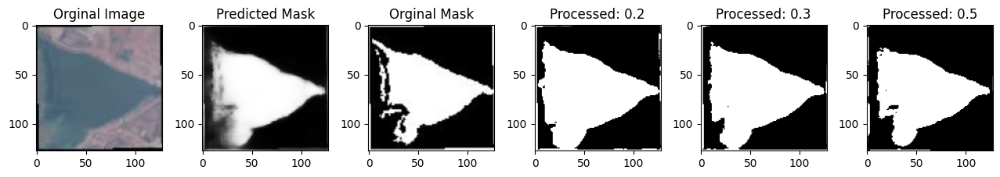

97/97 ━━━━━━━━━━━━━━━━━━━━ 4s 44ms/step - accuracy: 0.7658 - loss: 0.2006
Epoch 61/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepep - accuracy: 0.7648 - loss: 0.20


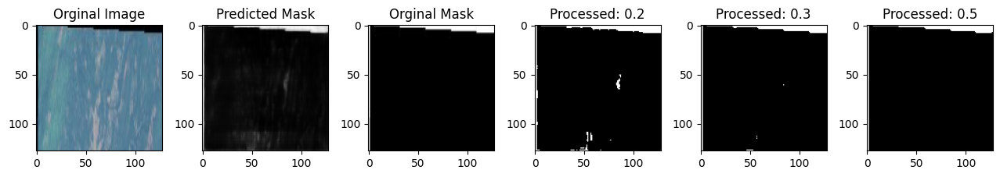

97/97 ━━━━━━━━━━━━━━━━━━━━ 4s 44ms/step - accuracy: 0.7648 - loss: 0.2048
Epoch 62/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepep - accuracy: 0.7624 - loss: 0.20


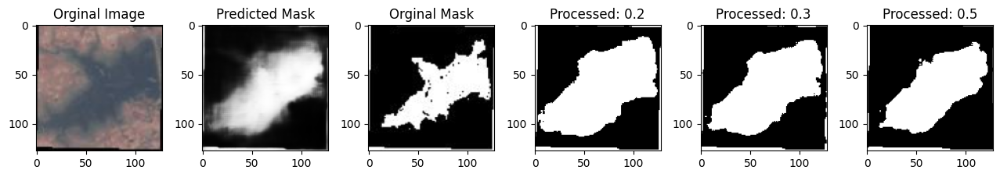

97/97 ━━━━━━━━━━━━━━━━━━━━ 4s 44ms/step - accuracy: 0.7624 - loss: 0.2068
Epoch 63/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepep - accuracy: 0.7651 - loss: 0.20


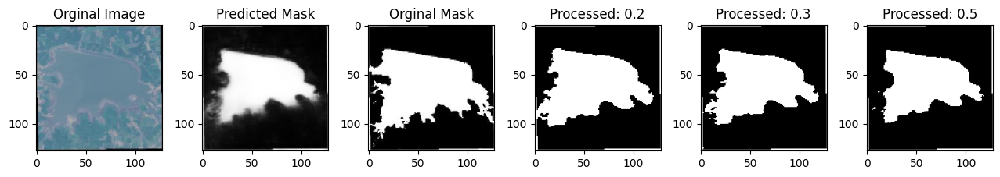

97/97 ━━━━━━━━━━━━━━━━━━━━ 4s 44ms/step - accuracy: 0.7651 - loss: 0.2012
Epoch 64/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepep - accuracy: 0.7722 - loss: 0.19


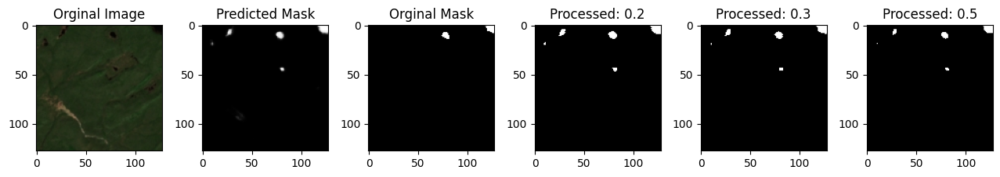

97/97 ━━━━━━━━━━━━━━━━━━━━ 4s 44ms/step - accuracy: 0.7721 - loss: 0.1952
Epoch 65/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/steptep - accuracy: 0.7713 - loss: 0.19


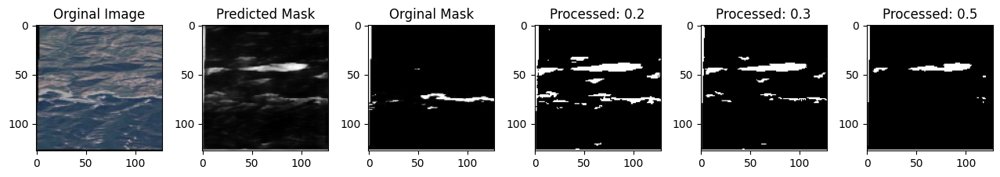

97/97 ━━━━━━━━━━━━━━━━━━━━ 4s 44ms/step - accuracy: 0.7713 - loss: 0.1978
Epoch 66/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepep - accuracy: 0.7710 - loss: 0.20


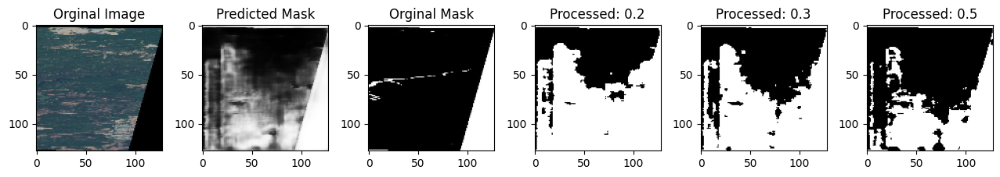

97/97 ━━━━━━━━━━━━━━━━━━━━ 4s 46ms/step - accuracy: 0.7709 - loss: 0.2032
Epoch 67/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/stepep - accuracy: 0.7671 - loss: 0.200


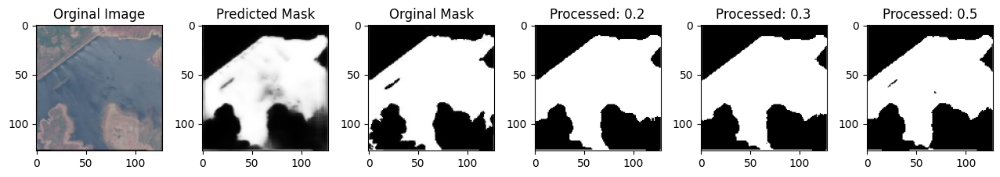

97/97 ━━━━━━━━━━━━━━━━━━━━ 4s 44ms/step - accuracy: 0.7671 - loss: 0.2003
Epoch 68/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepep - accuracy: 0.7508 - loss: 0.259


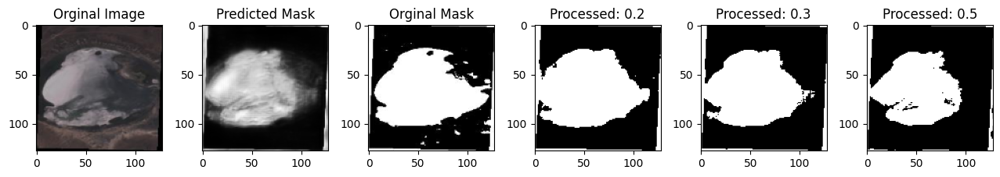

97/97 ━━━━━━━━━━━━━━━━━━━━ 4s 44ms/step - accuracy: 0.7508 - loss: 0.2592
Epoch 69/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepep - accuracy: 0.7570 - loss: 0.23


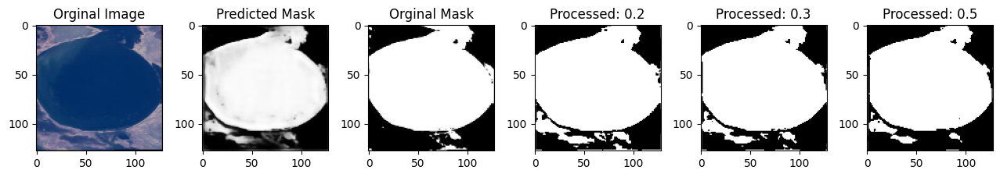

97/97 ━━━━━━━━━━━━━━━━━━━━ 4s 44ms/step - accuracy: 0.7570 - loss: 0.2352
Epoch 70/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepep - accuracy: 0.7547 - loss: 0.259


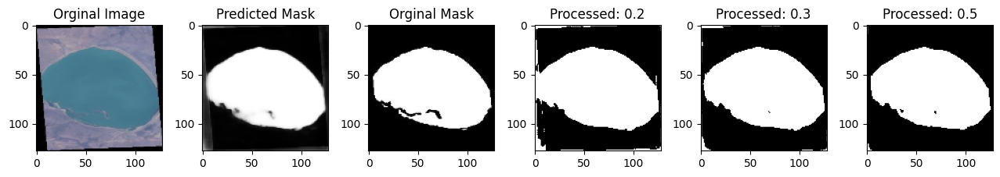

97/97 ━━━━━━━━━━━━━━━━━━━━ 4s 44ms/step - accuracy: 0.7547 - loss: 0.2597
Epoch 71/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepep - accuracy: 0.7626 - loss: 0.220


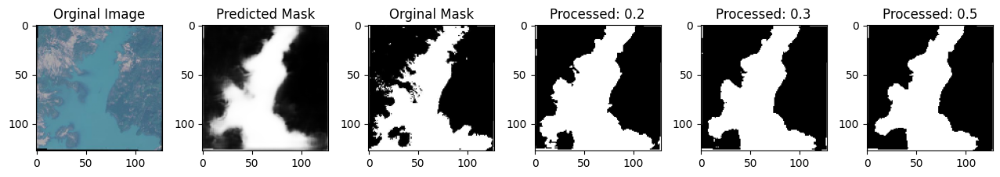

97/97 ━━━━━━━━━━━━━━━━━━━━ 4s 44ms/step - accuracy: 0.7627 - loss: 0.2202
Epoch 72/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepep - accuracy: 0.7678 - loss: 0.20


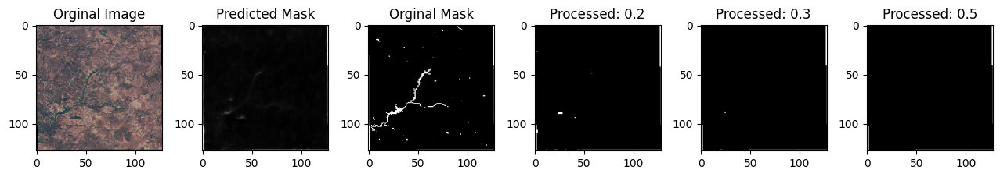

97/97 ━━━━━━━━━━━━━━━━━━━━ 4s 44ms/step - accuracy: 0.7677 - loss: 0.2100
Epoch 73/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/stepep - accuracy: 0.7628 - loss: 0.210


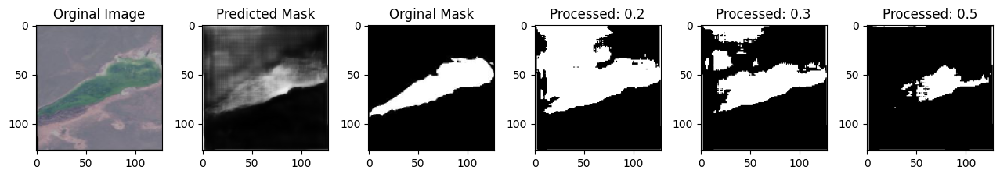

97/97 ━━━━━━━━━━━━━━━━━━━━ 4s 43ms/step - accuracy: 0.7628 - loss: 0.2107
Epoch 74/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepep - accuracy: 0.7728 - loss: 0.19


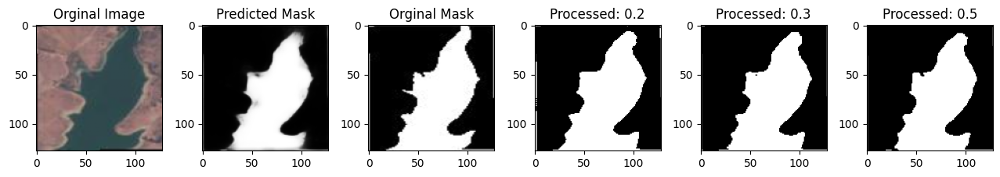

97/97 ━━━━━━━━━━━━━━━━━━━━ 4s 43ms/step - accuracy: 0.7727 - loss: 0.1972
Epoch 75/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepep - accuracy: 0.7733 - loss: 0.19


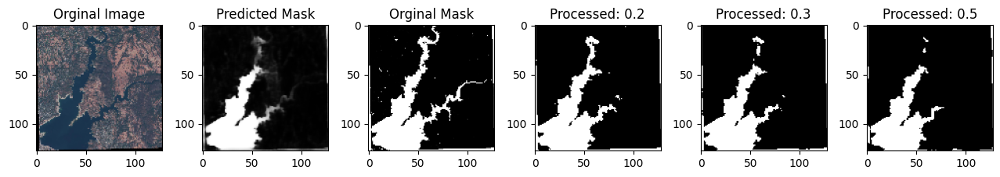

97/97 ━━━━━━━━━━━━━━━━━━━━ 4s 44ms/step - accuracy: 0.7732 - loss: 0.1977
Epoch 76/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepep - accuracy: 0.7729 - loss: 0.19


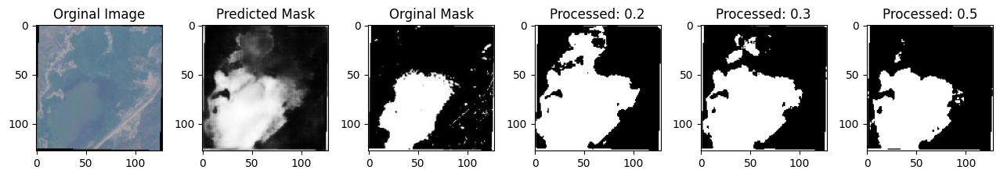

97/97 ━━━━━━━━━━━━━━━━━━━━ 4s 43ms/step - accuracy: 0.7729 - loss: 0.1921
Epoch 77/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepep - accuracy: 0.7776 - loss: 0.186


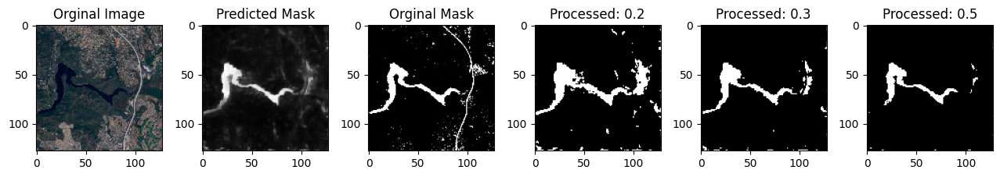

97/97 ━━━━━━━━━━━━━━━━━━━━ 4s 43ms/step - accuracy: 0.7775 - loss: 0.1868
Epoch 78/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepep - accuracy: 0.7657 - loss: 0.194


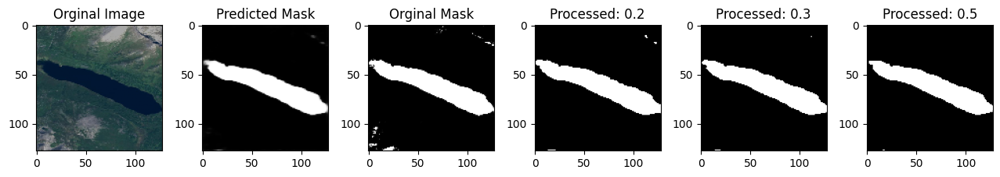

97/97 ━━━━━━━━━━━━━━━━━━━━ 4s 43ms/step - accuracy: 0.7657 - loss: 0.1948
Epoch 79/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepep - accuracy: 0.7750 - loss: 0.18


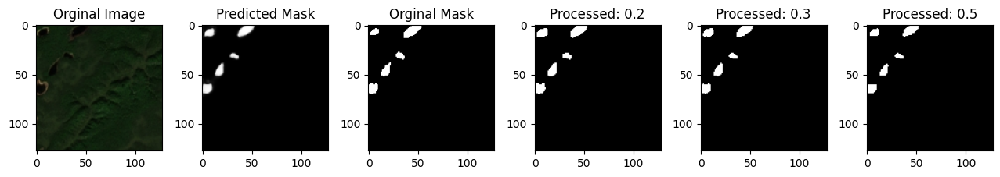

97/97 ━━━━━━━━━━━━━━━━━━━━ 4s 43ms/step - accuracy: 0.7749 - loss: 0.1839
Epoch 80/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepep - accuracy: 0.7733 - loss: 0.19


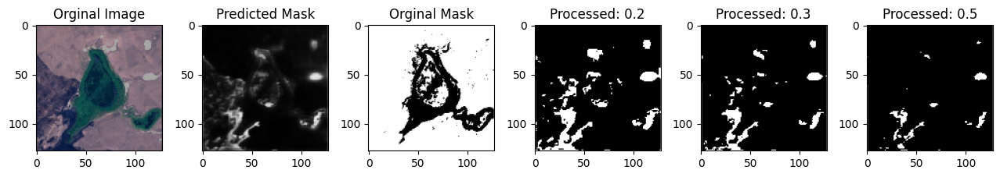

97/97 ━━━━━━━━━━━━━━━━━━━━ 4s 44ms/step - accuracy: 0.7732 - loss: 0.1949
Epoch 81/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepep - accuracy: 0.7724 - loss: 0.18


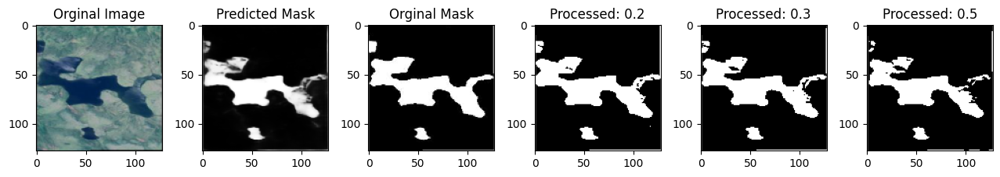

97/97 ━━━━━━━━━━━━━━━━━━━━ 4s 44ms/step - accuracy: 0.7723 - loss: 0.1899
Epoch 82/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepep - accuracy: 0.7667 - loss: 0.19


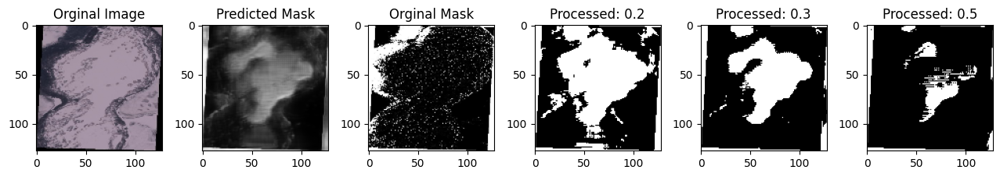

97/97 ━━━━━━━━━━━━━━━━━━━━ 4s 44ms/step - accuracy: 0.7667 - loss: 0.1938
Epoch 83/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepep - accuracy: 0.7719 - loss: 0.18


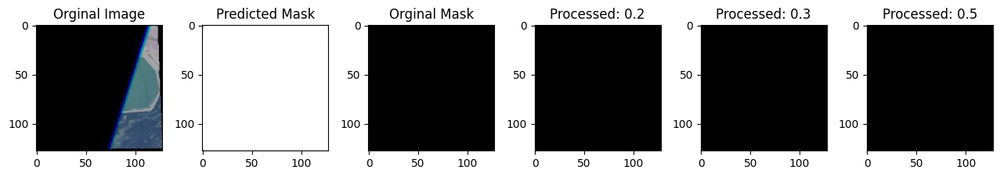

97/97 ━━━━━━━━━━━━━━━━━━━━ 4s 44ms/step - accuracy: 0.7719 - loss: 0.1881
Epoch 84/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepep - accuracy: 0.7508 - loss: 0.25


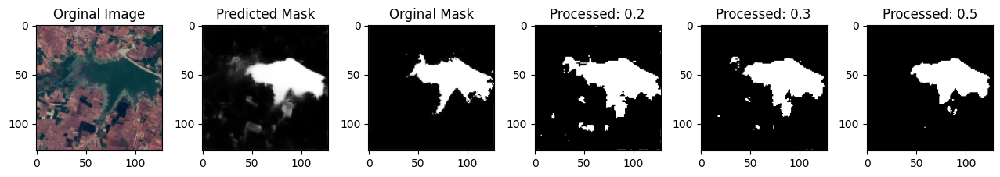

97/97 ━━━━━━━━━━━━━━━━━━━━ 4s 44ms/step - accuracy: 0.7509 - loss: 0.2538
Epoch 85/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepep - accuracy: 0.7694 - loss: 0.192


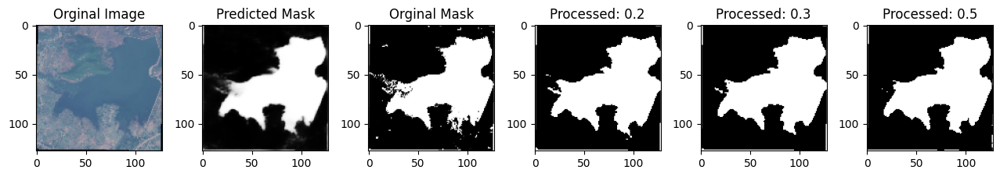

97/97 ━━━━━━━━━━━━━━━━━━━━ 4s 46ms/step - accuracy: 0.7694 - loss: 0.1929
Epoch 86/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepep - accuracy: 0.7719 - loss: 0.189


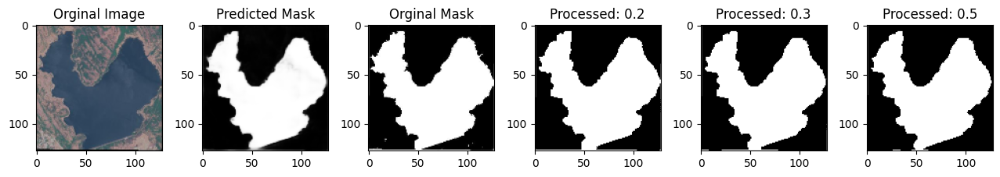

97/97 ━━━━━━━━━━━━━━━━━━━━ 4s 44ms/step - accuracy: 0.7718 - loss: 0.1897
Epoch 87/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepep - accuracy: 0.7638 - loss: 0.19


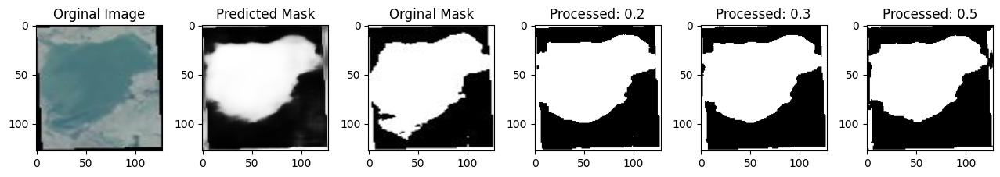

97/97 ━━━━━━━━━━━━━━━━━━━━ 4s 44ms/step - accuracy: 0.7639 - loss: 0.1995
Epoch 88/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepep - accuracy: 0.7736 - loss: 0.17


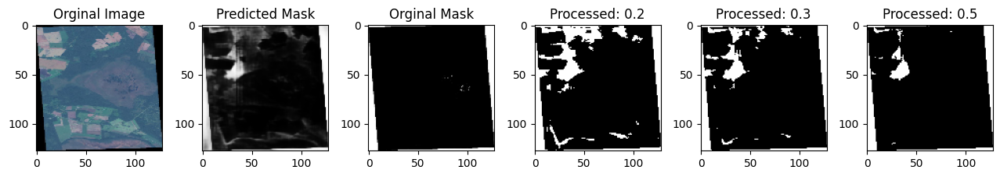

97/97 ━━━━━━━━━━━━━━━━━━━━ 4s 44ms/step - accuracy: 0.7736 - loss: 0.1799
Epoch 89/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/stepep - accuracy: 0.7699 - loss: 0.183


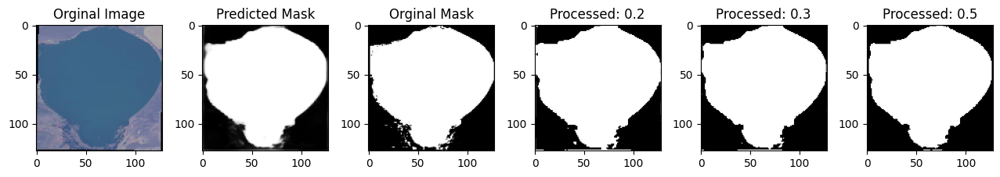

97/97 ━━━━━━━━━━━━━━━━━━━━ 4s 44ms/step - accuracy: 0.7699 - loss: 0.1831
Epoch 90/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/stepep - accuracy: 0.7786 - loss: 0.178


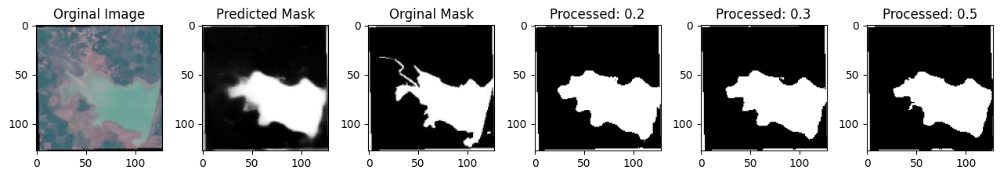

97/97 ━━━━━━━━━━━━━━━━━━━━ 4s 44ms/step - accuracy: 0.7784 - loss: 0.1787
Epoch 91/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepep - accuracy: 0.7743 - loss: 0.18


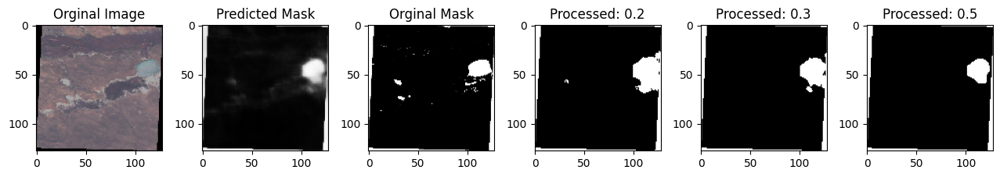

97/97 ━━━━━━━━━━━━━━━━━━━━ 4s 44ms/step - accuracy: 0.7742 - loss: 0.1877
Epoch 92/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepep - accuracy: 0.7769 - loss: 0.18


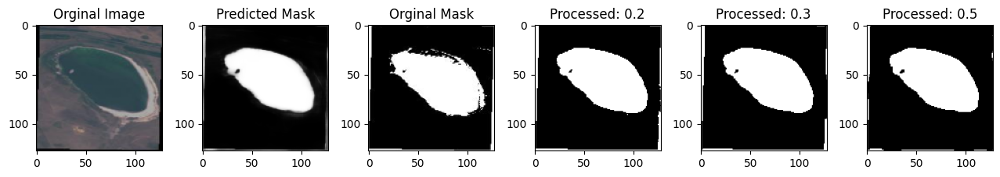

97/97 ━━━━━━━━━━━━━━━━━━━━ 4s 44ms/step - accuracy: 0.7768 - loss: 0.1817
Epoch 93/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepep - accuracy: 0.7723 - loss: 0.18


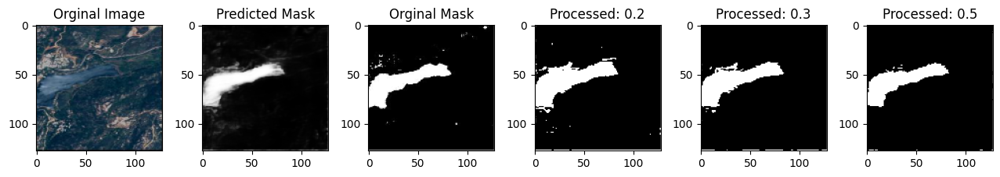

97/97 ━━━━━━━━━━━━━━━━━━━━ 4s 44ms/step - accuracy: 0.7723 - loss: 0.1826
Epoch 94/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepep - accuracy: 0.7703 - loss: 0.179


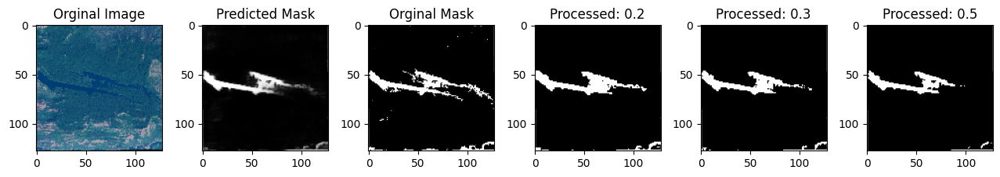

97/97 ━━━━━━━━━━━━━━━━━━━━ 4s 46ms/step - accuracy: 0.7704 - loss: 0.1792
Epoch 95/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/stepep - accuracy: 0.7737 - loss: 0.187


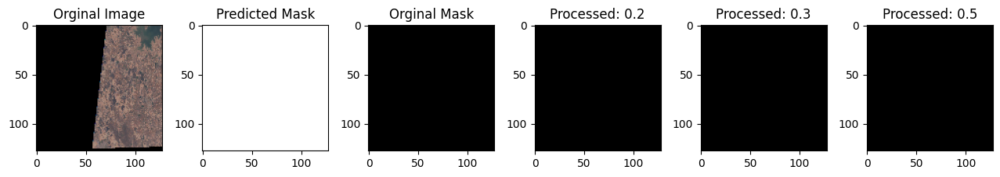

97/97 ━━━━━━━━━━━━━━━━━━━━ 4s 44ms/step - accuracy: 0.7736 - loss: 0.1878
Epoch 96/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepep - accuracy: 0.7688 - loss: 0.18


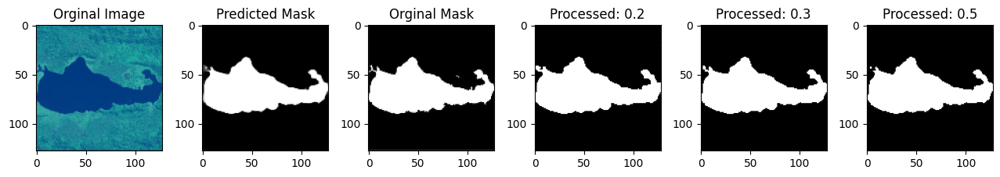

97/97 ━━━━━━━━━━━━━━━━━━━━ 4s 44ms/step - accuracy: 0.7688 - loss: 0.1887
Epoch 97/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepep - accuracy: 0.7627 - loss: 0.21


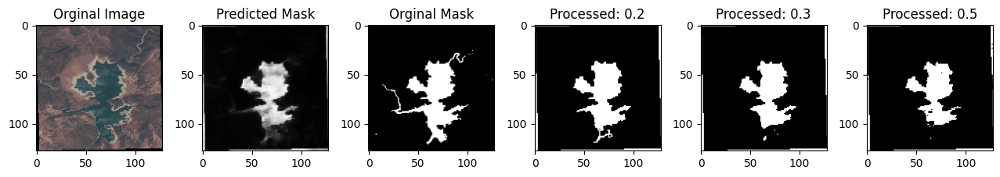

97/97 ━━━━━━━━━━━━━━━━━━━━ 4s 43ms/step - accuracy: 0.7627 - loss: 0.2105
Epoch 98/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepep - accuracy: 0.7738 - loss: 0.18


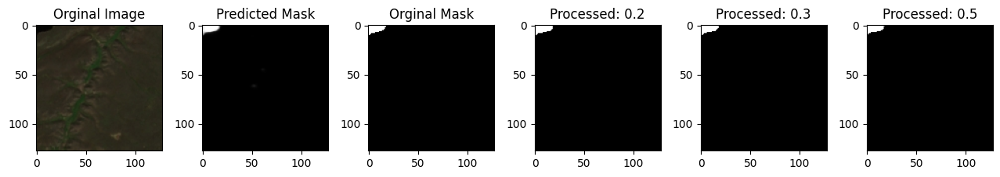

97/97 ━━━━━━━━━━━━━━━━━━━━ 4s 43ms/step - accuracy: 0.7738 - loss: 0.1832
Epoch 99/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepep - accuracy: 0.7731 - loss: 0.182


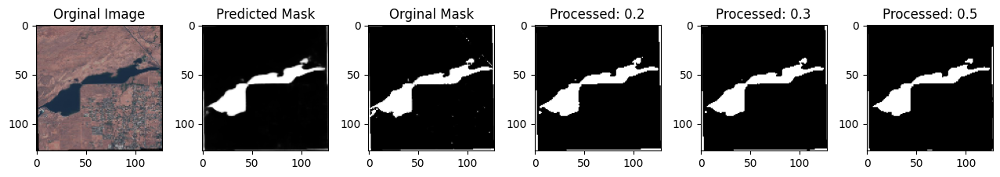

97/97 ━━━━━━━━━━━━━━━━━━━━ 4s 43ms/step - accuracy: 0.7731 - loss: 0.1821
Epoch 100/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepep - accuracy: 0.7714 - loss: 0.18


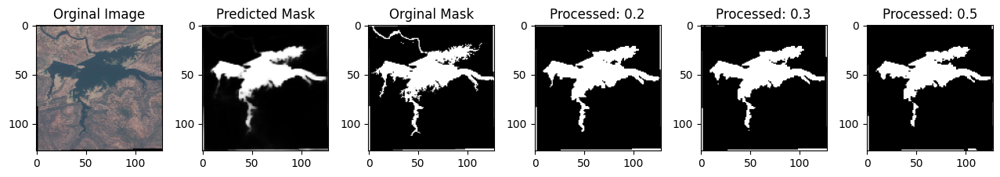

97/97 ━━━━━━━━━━━━━━━━━━━━ 4s 43ms/step - accuracy: 0.7714 - loss: 0.1836


In [20]:
# Training
epochs = 100
batch_size = 32

history = model.fit(images_train, mask_train,
                    epochs=epochs,
                    callbacks=[ShowProgress()],
                    batch_size=batch_size)

In [21]:
from datetime import datetime

# Get the current date and time
current_time = datetime.now().strftime('%Y-%m-%d_%H-%M-%S')

# Save the model with the current date and time in the filename
model.save(f'../models/{current_time}.keras')

In [27]:
# Make predictions
predictions = model.predict(images_test)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step
